In [98]:
%matplotlib widget
from i_o import Paths, RegisteredVolumeReader, VolumeReader
import numpy as np
import cupy as cp
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
import os, glob, h5py, json
import importlib, pathlib
from daio.h5 import lazyh5
from video import create_projection_image, showvid, get_clipped_array, AVWriter2
from cupyx.scipy.ndimage import maximum_filter, median_filter, convolve1d
from signal_extraction import peristimulus_histogram, stimulus_correlation
from widgets import play_video_widget
from matplotlib.gridspec import GridSpec
from util import plot_traces

from collections import defaultdict
import warpfield
from IPython.display import JSON
import pandas as pd
from widgets import ortho_views_widget
from signal_extraction import peristimulus_histogram

from video import create_projection_image, create_projection_image_heatmap

(217186,)


{0: 'Pulse', 1: '800Hz sine', 2: '1200Hz sine', 3: '2400Hz sine'}

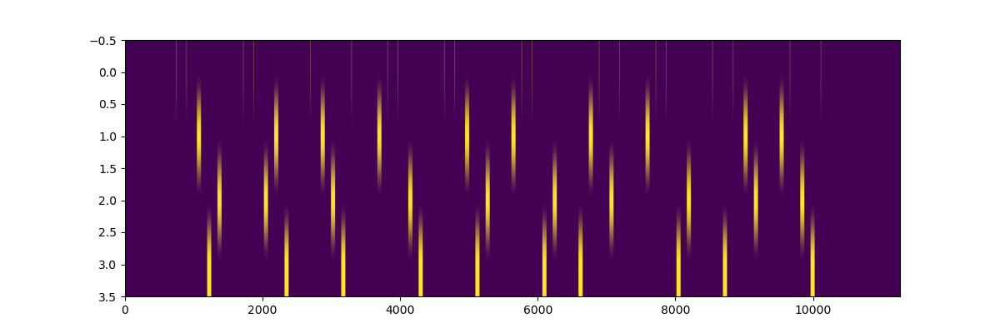

In [31]:
pn_psfs = r"~/hpc-rw/lfm/psfs"
# pn_rec = r"~/hpc-r/lfm2025/recordings/2025_0818_zf_audiostim"
pn_rec = r"~/hpc-r/lfm2025/recordings/"
pn_bg = r"~/hpc-rw/lfm/bg"
url_home = r"/home/lubo12/"
pn_out = r"~/hpc-rw/lfm/results"

dataset_name = "20250828_1718_LB_zf552_para_f1_4"
# dataset_name = "20250902_1940_LB_ZF552_f2_stim2_3"
psf_name = "20250819_1203_PSF_LB_25x_5fps"
bg_name = "20250819_1730_LB_25x_75fps_bg.npy"

import i_o
importlib.reload(i_o)
from i_o import Paths

paths = Paths(dataset_name=dataset_name,
              psf_name = psf_name,
              bg_name=bg_name,
              pn_bg= pn_bg,
              pn_rec = pn_rec,
              pn_psfs=pn_psfs,
              pn_out=pn_out,
              url_home=url_home,)

traces_data = lazyh5(paths.traces)
# traces_data = lazyh5(paths.pn_outrec+"/traces_3x3x3.h5")
traces = traces_data["traces"]
# segmentation =  lazyh5(paths.segmentation)["segmentation"]
segmentation = traces_data["segmentation"]
print(np.unique(segmentation).shape)
traces_data
import i_o, importlib, pickle
importlib.reload(i_o)
from i_o import get_stimulus, parse_combinations
with open("readable_75fps_stim.pkl", "rb") as f: 
    final_stimulus_id, stim_names = pickle.load(f)
combs = {"pulse": "pulse"}

combinations = parse_combinations(stim_names, combs)
label_to_idx = {v: k for k, v in stim_names.items()}
stim_names_comb = stim_names.copy()
stim_idx = max(stim_names.keys()) + 1

for comb_name, comb_labels in combinations.items():
    stim_names_comb[stim_idx] = comb_name
    stim_idx += 1

# --- Build bool_stimulus ---
n_stim = len(stim_names_comb)
bool_stim = np.zeros((final_stimulus_id.shape[0], n_stim), dtype=bool)


# Individual stimuli (skip silence, which is 0)
for idx in range(1, len(stim_names)):
    bool_stim[:, idx] = final_stimulus_id == idx

if combinations != {}:
    stim_names_comb[0] = "all"
    # First row: True when not silence
    bool_stim[:, 0] = final_stimulus_id != 0
    label_to_indices = defaultdict(list)
    for k, v in stim_names_comb.items():
        label_to_indices[v].append(k)
            
    # Combination stimuli
    for i, (comb_name, comb_labels) in enumerate(combinations.items()):
        comb_idx = len(stim_names) + i
        indices = []
        for lbl in comb_labels:
            indices.extend(label_to_indices[lbl])
        mask = np.isin(final_stimulus_id, indices)
        bool_stim[:, comb_idx] = mask
    stim_names = stim_names_comb

stim_names = { 0: '1200Hz sine',
 1: '800Hz sine',
 2: '2400Hz sine',
 3: 'Pulse'}
bool_stim = bool_stim[:,-4:]

# Desired order
order = [3, 1, 0, 2]

# Reorder stim_names
stim_names = {i: stim_names[j] for i, j in enumerate(order)}

# Reorder bool_stim columns
bool_stim = bool_stim[:, order]

fig, ax = plt.subplots(1,1,figsize=(12,4))
ax.imshow(bool_stim[:,:].T, aspect="auto")
stim_names

(219318,)


{0: 'Pulse', 1: '400Hz sine', 2: '800Hz sine', 3: '1200Hz sine'}

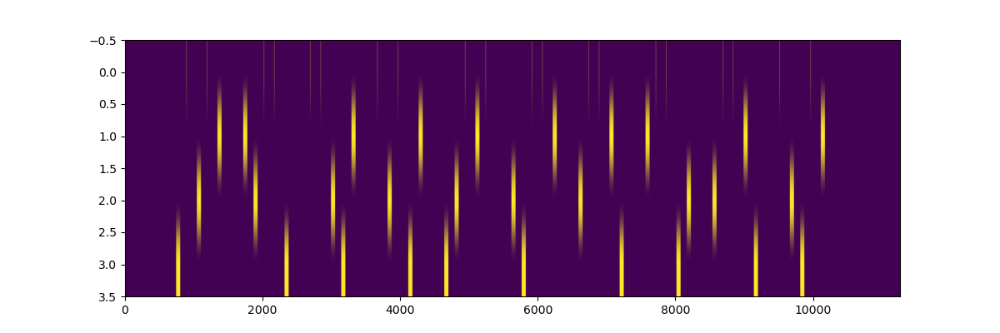

In [138]:
pn_psfs = r"~/hpc-rw/lfm/psfs"
# pn_rec = r"~/hpc-r/lfm2025/recordings/2025_0818_zf_audiostim"
pn_rec = r"~/hpc-r/lfm2025/recordings/"
pn_bg = r"~/hpc-rw/lfm/bg"
url_home = r"/home/lubo12/"
pn_out = r"~/hpc-rw/lfm/results"

# dataset_name = "20250828_1718_LB_zf552_para_f1_4"
dataset_name = "20250902_1940_LB_ZF552_f2_stim2_3"
psf_name = "20250819_1203_PSF_LB_25x_5fps"
bg_name = "20250819_1730_LB_25x_75fps_bg.npy"

import i_o
importlib.reload(i_o)
from i_o import Paths

paths = Paths(dataset_name=dataset_name,
              psf_name = psf_name,
              bg_name=bg_name,
              pn_bg= pn_bg,
              pn_rec = pn_rec,
              pn_psfs=pn_psfs,
              pn_out=pn_out,
              url_home=url_home,)

# traces_data = lazyh5(paths.traces)
traces_data = lazyh5(paths.pn_outrec+"/traces_3x3x3.h5")
traces = traces_data["traces"]
segmentation =  lazyh5(paths.segmentation)["segmentation"]
# segmentation = traces_data["segmentation"]
print(np.unique(segmentation).shape)
traces_data
import i_o, importlib, pickle
importlib.reload(i_o)
from i_o import get_stimulus, parse_combinations
with open("readable_75fps_stim_2.pkl", "rb") as f: 
    final_stimulus_id, stim_names = pickle.load(f)
combs = {"pulse": "pulse"}

combinations = parse_combinations(stim_names, combs)
label_to_idx = {v: k for k, v in stim_names.items()}
stim_names_comb = stim_names.copy()
stim_idx = max(stim_names.keys()) + 1

for comb_name, comb_labels in combinations.items():
    stim_names_comb[stim_idx] = comb_name
    stim_idx += 1

# --- Build bool_stimulus ---
n_stim = len(stim_names_comb)
bool_stim = np.zeros((final_stimulus_id.shape[0], n_stim), dtype=bool)


# Individual stimuli (skip silence, which is 0)
for idx in range(1, len(stim_names)):
    bool_stim[:, idx] = final_stimulus_id == idx

if combinations != {}:
    stim_names_comb[0] = "all"
    # First row: True when not silence
    bool_stim[:, 0] = final_stimulus_id != 0
    label_to_indices = defaultdict(list)
    for k, v in stim_names_comb.items():
        label_to_indices[v].append(k)
            
    # Combination stimuli
    for i, (comb_name, comb_labels) in enumerate(combinations.items()):
        comb_idx = len(stim_names) + i
        indices = []
        for lbl in comb_labels:
            indices.extend(label_to_indices[lbl])
        mask = np.isin(final_stimulus_id, indices)
        bool_stim[:, comb_idx] = mask
    stim_names = stim_names_comb

stim_names = { 0: '1200Hz sine',
 1: '400Hz sine',
 2: '800Hz sine',
 3: 'Pulse'}
bool_stim = bool_stim[:,-4:]

# Desired order
order = [3, 1, 2, 0]

# Reorder stim_names
stim_names = {i: stim_names[j] for i, j in enumerate(order)}

# Reorder bool_stim columns
bool_stim = bool_stim[:, order]

zpos = lazyh5(paths.deconvolved)["zpos"]

fig, ax = plt.subplots(1,1,figsize=(12,4))
ax.imshow(bool_stim[:,:].T, aspect="auto")
stim_names

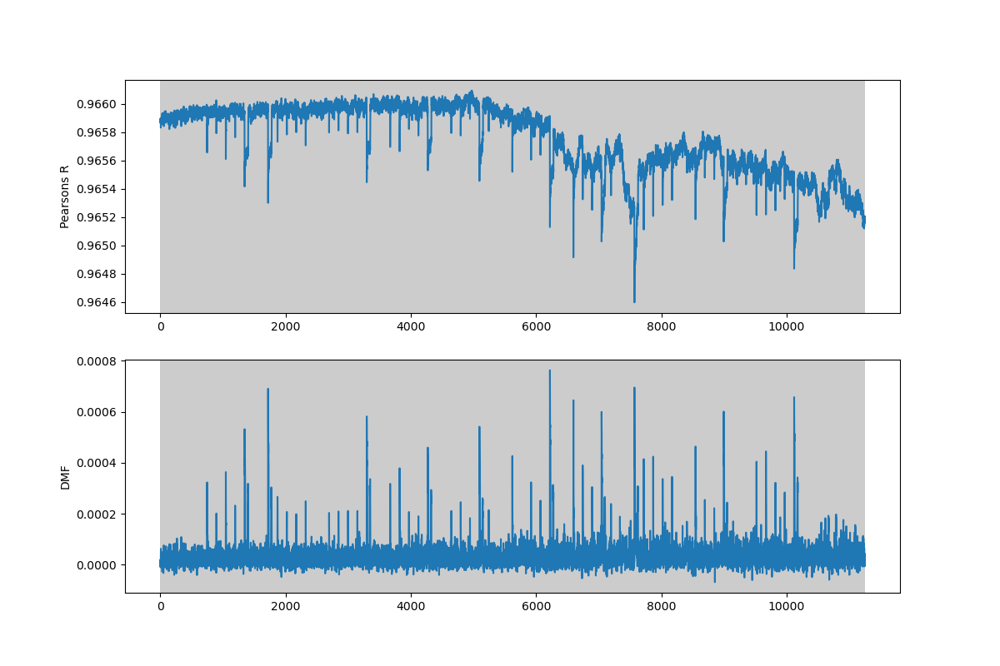

In [139]:
from cupyx.scipy.ndimage import maximum_filter, median_filter, convolve1d

r_thresh = 0.95
dmf_thresh = 0.0013

fig, axs = plt.subplots(2,1,figsize=(12,8))
ax = axs.flatten()

reg = lazyh5(paths.registered)
metrics = reg["metrics"].T
r = metrics[0]
ax[0].plot(r)
ax[0].set_ylabel("Pearsons R")
dmf =(maximum_filter(median_filter(cp.asarray(r), 3), size=21) - cp.asarray(r)).get()
ax[1].plot(dmf)
ax[1].set_ylabel("DMF")
trace_mask = np.ones_like(metrics[0], dtype = bool)
trace_mask[(dmf > dmf_thresh) | (r < r_thresh) | np.isnan(r)] = 0

neighbor_sum = convolve1d(cp.asarray(trace_mask).astype(cp.int8), weights=cp.array([1,1, 1]), mode='constant', cval=0).get()
trace_mask = trace_mask ^ ((trace_mask == True) & (neighbor_sum == 1))


if dataset_name == "20250818_2111_LB_zf552_f25x_f2_audiostim_40fps_1":
    trace_mask = np.ones(shape=(7219,))
    trace_mask[1764:1796]=0
    trace_mask[5322:5342]=0
    trace_mask[7198:]=0
    trace_mask = trace_mask.astype(bool)

diff = np.diff(np.concatenate(([False], trace_mask, [False])).astype(int))

# Find the start and end frame indices of each shaded region
starts_idx = np.where(diff == 1)[0]
ends_idx = np.where(diff == -1)[0]



for start, end in zip(starts_idx, ends_idx):
    # axvspan draws a vertical rectangle from start_time to end_time
    ax[0].axvspan(start,end, color='gray', alpha=0.4,zorder=0,linewidth=0  )
    ax[1].axvspan(start,end, color='gray', alpha=0.4,zorder=0,linewidth=0  )
# Redraw the figure to show the new spans
fig.canvas.draw()

In [140]:
data = traces[trace_mask]

In [141]:
data -= data.mean(axis=0)

In [ ]:
import nibabel as nib
from sklearn.decomposition import FastICA
from scipy.stats import zscore
from sklearn.utils.extmath import randomized_svd


normalization_threshold = 0.4
initial_components=60

# Initial SVD to capture main signal components
u, s, v = randomized_svd(data, n_components=initial_components, random_state=42)

s = np.diag(s)

# Soft thresholding to remove small fluctuations in component space
v[np.abs(v) < normalization_threshold*np.std(v)]=0

residual_std = np.maximum(np.std(data - (u @ s @ v), axis=0), 1)
data /= residual_std[np.newaxis, :]

#check_dimensionality
u, s, v = randomized_svd(data, n_components=500, random_state=42)
fig, ax = plt.subplots(1,1,figsize=(8,5))
plt.plot(np.log(s))

In [ ]:
from sklearn.utils.extmath import randomized_svd
Npc = 100
u, s, v = randomized_svd(data, n_components=Npc, random_state=42)

In [ ]:
from matplotlib.gridspec import GridSpec
import imageio
fn = os.path.join(paths.pn_outrec, "ica")
if not os.path.exists(fn):
    os.makedirs(fn)

# The singular values from randomized_svd are already sorted in descending order.
# The explained variance is proportional to the square of the singular values.
# s = np.diag(s)
explained_variance = s**2 / np.sum(s**2)
ref_vol = lazyh5(paths.registered)["ref_vol"]

images_for_video = []
for i in tqdm(range(Npc)):
    fig = plt.figure(layout="constrained", figsize=(12,8))
    variance_percentage = explained_variance[i] * 100
    fig.suptitle(f'Principal Component {i+1} (Variance: {variance_percentage:.2f}%)', fontsize=16)
    gs = GridSpec(2, 3, figure=fig)
    ax0 = fig.add_subplot(gs[0, :])
    
    # --- Plot 1: Temporal Trace ---
    temporal_trace = u[:, i]
    time_axis = np.arange(u.shape[0]) / 40
    ax0.plot(time_axis, temporal_trace)
    
    ax0.set_xlabel("Time (s)")
    ax0.set_ylabel("Amplitude")
    
    ax1 = fig.add_subplot(gs[1,0])
    # --- Plot 2: Power Spectrum ---
    # Calculate FFT and power spectrum for the temporal trace
    fft_vals = np.fft.fft(temporal_trace)
    power_spectrum = np.abs(fft_vals)**2
    freqs = np.fft.fftfreq(u.shape[0], d=1/40)
    
    # Plot only the positive frequencies
    positive_freq_mask = freqs >= 0
    ax1.plot(freqs[positive_freq_mask][1::4,], power_spectrum[positive_freq_mask][1::4,])
    ax1.set_title("Power Spectrum")
    ax1.set_xlabel("Frequency (Hz)")
    ax1.set_ylabel("Power")
    ax1.set_yscale('log')
    # ax1.set_xscale('log')
    
    # reproject into spatial dimension
    ax2 = fig.add_subplot(gs[1,1:])
    
    spatial_trace = np.zeros(v.shape[1]+1, dtype = v.dtype)
    spatial_trace[1:]=v[i,:]
    volume = spatial_trace[segmentation]
    hvmax = 0.02
    ax2.imshow(create_projection_image_heatmap(ref_vol, volume,vmax=13, absolute_limits=True, 
                                               heatmap_vmax=hvmax, transpose =True,
                                              scalebar = 200, zpos = zpos))
    
    # Save figure to a buffer and append to list for video
    fig.canvas.draw()
    image = np.frombuffer(fig.canvas.buffer_rgba(), dtype='uint8')
    image = image.reshape(fig.canvas.get_width_height()[::-1] + (4,))
    images_for_video.append(image[:,:,:3]) # Convert from RGBA to RGB
    plt.close(fig)

# Create and save the video
video_path = os.path.join(fn, f"components_hvmax{hvmax}.mp4")


imageio.mimsave(video_path, images_for_video, fps=2)

print(f"Video saved to {video_path}")
play_video_widget(video_path)

In [108]:
# Optional: Remove motion/noise components
Npc = v.shape[0]
motion_components = [3,4,5]  # Indices of components to remove
goodPC = [i for i in range(Npc) if i not in np.array(motion_components)-1]
newv = v[goodPC]
Npc = len(goodPC)


In [110]:
# Apply FastICA algorithm
ica = FastICA(n_components=Npc, random_state=42, max_iter=1000, tol=0.001)
icasig = ica.fit_transform(newv.T)
A = ica.mixing_  # Mixing matrix
W = ica.components_  # Unmixing matrix

# Form ICA maps
GM = icasig.T
GMstd = np.std(GM, axis=0)
GMv = GM / GMstd[np.newaxis, :]  # Z-score normalization

# Correct sign ambiguity (ensure positive side is stronger than negative)
GMzp = GMv - 2
GMzp[GMzp < 0] = 0
GMzpm = np.mean(GMzp, axis=1)

GMzn = GMv + 2
GMzn[GMzn > 0] = 0
GMznm = np.mean(GMzn, axis=1)

# Apply sign correction
sign_correction = np.sign(GMzpm + GMznm)
GMs = GM * sign_correction[:,np.newaxis]

# Get ICA time series
TS = u[:, goodPC] @ np.diag(s[goodPC]) @ A
TSs = TS * sign_correction[np.newaxis, :]

# Reorder components by variance
varo = np.var(TS, axis=0)
Order = np.argsort(varo)[::-1]  # Descending order
TSo = TSs[:, Order]
GMo = GMs[Order,:]





In [111]:
from matplotlib.gridspec import GridSpec
import imageio

# The singular values from randomized_svd are already sorted in descending order.
# The explained variance is proportional to the square of the singular values.
# s = np.diag(s)
explained_variance = varo[Order]/varo.sum()
ref_vol = lazyh5(paths.registered)["ref_vol"]
pad = 30
psth = peristimulus_histogram(TSs, bool_stim[trace_mask], pad = pad)

images_for_video = []
for i in tqdm(range(Npc)):
    fig = plt.figure(layout="constrained", figsize=(12,8))
    variance_percentage = explained_variance[i] * 100
    fig.suptitle(f'Component {i+1} (Variance: {variance_percentage:.2f}%)', fontsize=16)
    gs = GridSpec(3, 3, figure=fig, height_ratios = [1,0.65,0.65], width_ratios = [0.6,0.6,2])
    ax0 = fig.add_subplot(gs[0, :])
    
    # --- Plot 1: Temporal Trace ---
    temporal_trace = TSs[:, i]
    time_axis = np.arange(temporal_trace.shape[0]) / 75
    ax0.plot(time_axis, -temporal_trace)
    
    ax0.set_xlabel("Time (s)")
    ax0.set_ylabel("-Fluorescence intensity")
    

    stim_axes = [fig.add_subplot(gs[1,0]),fig.add_subplot(gs[1,1]),fig.add_subplot(gs[2,0]),fig.add_subplot(gs[2,1])]
    for j in range(4):
        ax = stim_axes[j]
        centered_trace = -psth[j,i,:,0]
        centered_trace_std = -psth[j,i,:,1]
        time = np.arange(centered_trace.shape[0])-pad
        ax.fill_between(time, centered_trace-centered_trace_std, centered_trace+centered_trace_std, color='gray', alpha=0.3,edgecolor='none')
        ax.plot(time, centered_trace, color='black', lw=2)
        start = pad
        stim_length = (np.where(np.diff(bool_stim[:,j].astype(int))==-1)[0]-np.where(np.diff(bool_stim[:,j].astype(int))==1)[0]).max()
        ax.axvspan(start-0.5-pad, start+stim_length-0.5-pad, color="red", alpha=0.3) 
        if j in (0,1):
            ax.set_xticklabels([])
        else:
            ax.set_xlabel("centered frames")
        
        if j in (1,3):
            ax.set_yticklabels([])
        else:
            ax.set_ylabel("-Fluorescence intensity")
        ax.set_ylim(-psth[:,i,:,0].max()-(psth[:,i,:,1].max()*1),-psth[:,i,:,0].min()+(psth[:,i,:,1].max()*1))
        ax.set_title(stim_names[j])
    
    
    # reproject into spatial dimension
    ax2 = fig.add_subplot(gs[1:,2:])

    spatial_trace = np.zeros(GMo.shape[1]+1, dtype = GMo.dtype)
    spatial_trace[1:]=GMo[i,:]
    volume = spatial_trace[segmentation]
    ax2.imshow(create_projection_image_heatmap(ref_vol, volume,vmax=13, absolute_limits=True, heatmap_vmin = 0, heatmap_vmax=3, transpose =True),
              aspect = "auto")
    ax2.set_xticks([])
    ax2.set_yticks([])
    
    # Save figure to a buffer and append to list for video
    fig.canvas.draw()
    image = np.frombuffer(fig.canvas.buffer_rgba(), dtype='uint8')
    image = image.reshape(fig.canvas.get_width_height()[::-1] + (4,))
    images_for_video.append(image[:,:,:3]) # Convert from RGBA to RGB
    plt.close(fig)

# Create and save the video
video_path = os.path.join(fn, "ICA_unscored.mp4")


imageio.mimsave(video_path, images_for_video, fps=2)
play_video_widget(video_path)

Calculating average trace:   0%|          | 0/4 [00:00<?, ?it/s]

for cells:   0%|          | 0/97 [00:00<?, ?it/s]

for cells:   0%|          | 0/97 [00:00<?, ?it/s]

for cells:   0%|          | 0/97 [00:00<?, ?it/s]

for cells:   0%|          | 0/97 [00:00<?, ?it/s]

  0%|          | 0/97 [00:00<?, ?it/s]

[rawvideo @ 0x561e0814d100] Stream #0: not enough frames to estimate rate; consider increasing probesize


In [113]:
fn = os.path.join(paths.pn_outrec, "ica")
if not os.path.exists(fn):
    os.makedirs(fn)

# Z-score the component maps
GM1vn = GM / np.sqrt(np.var(GM, axis=0))
GM1vno = GM1vn[Order,:]

explained_variance = varo[Order]/varo.sum()
ref_vol = lazyh5(paths.registered)["ref_vol"]

threshold = 4

images_for_video = []
for i in tqdm(range(Npc)):
    fig, ax = plt.subplots(1,1, figsize=(12,8))
    variance_percentage = explained_variance[i] * 100
    fig.suptitle(f'Component {i+1} (Variance: {variance_percentage:.2f}%)', fontsize=16)

    spatial_trace = np.zeros(GMo.shape[1]+1, dtype = GMo.dtype)
    spatial_trace[1:]=GM1vno[i,:]
    volume = spatial_trace[segmentation]
    ax.imshow(create_projection_image_heatmap(ref_vol, cp.asarray(volume).clip(0,None).get(),vmax=13, absolute_limits=True, heatmap_vmin = threshold, heatmap_vmax=threshold+0.0001, transpose =True))

    # Save figure to a buffer and append to list for video
    fig.canvas.draw()
    image = np.frombuffer(fig.canvas.buffer_rgba(), dtype='uint8')
    image = image.reshape(fig.canvas.get_width_height()[::-1] + (4,))
    images_for_video.append(image[:,:,:3]) # Convert from RGBA to RGB
    plt.close(fig)

# Create and save the video
video_path = os.path.join(fn, f"ica_spatials_threshold{threshold}.mp4")


imageio.mimsave(video_path, images_for_video, fps=2)

play_video_widget(video_path)

  0%|          | 0/97 [00:00<?, ?it/s]

[rawvideo @ 0x55f4e2b68100] Stream #0: not enough frames to estimate rate; consider increasing probesize


In [119]:
data = u[:,goodPC]@np.diag(s[goodPC])@v[goodPC,:]
print(data.shape, traces.shape)

(11245, 219317) (11265, 219317)


In [121]:
# Create thresholded ROIs
GMz = GM.copy()
GMz[GM1vn < threshold] = 0  # Threshold at z=2.5
GM1vn[GM1vn < threshold] = 0

# data = traces[trace_mask]
data = u[:,goodPC]@np.diag(s[goodPC])@v[goodPC,:]

# Extract time series from original data using these ROIs
exclude = []
TSzmap = np.zeros((u.shape[0], Npc))
for j in tqdm(range(Npc)):
    nonzero_mask_pixels = np.sum(GMz[j, :] != 0)
    if nonzero_mask_pixels < 5:
        exclude.append(j)
        
    for i in range(u.shape[0]):
        new_trace = np.mean(data[i,:] * GMz[j,:])
        # Weighted average using the thresholded map as weights
        TSzmap[i,j] = new_trace

# # Reorder and save
Order_valid = [o for o in Order if o not in exclude]

TSzmapo = TSzmap[:, Order_valid]
GMzo = GMz[Order_valid,:]
Npc = len(Order_valid)
explained_variance_o = varo[Order_valid]/varo.sum()

  0%|          | 0/97 [00:00<?, ?it/s]

In [125]:
from matplotlib.gridspec import GridSpec
import imageio


ref_vol = lazyh5(paths.registered)["ref_vol"]
pad = 30
psth = peristimulus_histogram(TSzmapo, bool_stim[trace_mask], pad = pad)

images_for_video = []
for i in tqdm(range(Npc)):
    fig = plt.figure(layout="constrained", figsize=(12,8))
    variance_percentage = explained_variance_o[i] * 100
    fig.suptitle(f'Component {i+1} (Variance: {variance_percentage:.2f}%)', fontsize=16)
    gs = GridSpec(3, 3, figure=fig, height_ratios = [1,0.65,0.65], width_ratios = [0.6,0.6,2])
    ax0 = fig.add_subplot(gs[0, :])
    
    # --- Plot 1: Temporal Trace ---
    temporal_trace = TSzmapo[:, i]
    time_axis = np.arange(temporal_trace.shape[0]) / 75
    ax0.plot(time_axis, -temporal_trace)
    
    ax0.set_xlabel("Time (s)")
    ax0.set_ylabel("-Fluorescence intensity")
    

    stim_axes = [fig.add_subplot(gs[1,0]),fig.add_subplot(gs[1,1]),fig.add_subplot(gs[2,0]),fig.add_subplot(gs[2,1])]
    for j in range(4):
        ax = stim_axes[j]
        centered_trace = -psth[j,i,:,0]
        centered_trace_std = -psth[j,i,:,1]
        time = np.arange(centered_trace.shape[0])-pad
        ax.fill_between(time, centered_trace-centered_trace_std, centered_trace+centered_trace_std, color='gray', alpha=0.3,edgecolor='none')
        ax.plot(time, centered_trace, color='black', lw=2)
        start = pad
        stim_length = (np.where(np.diff(bool_stim[:,j].astype(int))==-1)[0]-np.where(np.diff(bool_stim[:,j].astype(int))==1)[0]).max()
        ax.axvspan(start-0.5-pad, start+stim_length-0.5-pad, color="red", alpha=0.3) 
        if j in (0,1):
            ax.set_xticklabels([])
        else:
            ax.set_xlabel("centered frames")
        
        if j in (1,3):
            ax.set_yticklabels([])
        else:
            ax.set_ylabel("-Fluorescence intensity")
        ax.set_ylim(-psth[:,i,:,0].max()-(psth[:,i,:,1].max()*1),-psth[:,i,:,0].min()+(psth[:,i,:,1].max()*1))
        ax.set_title(stim_names[j])
    
    
    # reproject into spatial dimension
    ax2 = fig.add_subplot(gs[1:,2:])

    spatial_trace = np.zeros(GMzo.shape[1]+1, dtype = GMzo.dtype)
    spatial_trace[1:]=GMzo[i,:]
    volume = spatial_trace[segmentation]
    ax2.imshow(create_projection_image_heatmap(ref_vol, cp.asarray(volume).clip(0, None).get(),vmax=13, pad = 20, absolute_limits=True, heatmap_vmin = threshold, heatmap_vmax=threshold+0.001, transpose =True)[:,:-3*20],
              aspect = "auto")
    ax2.set_xticks([])
    ax2.set_yticks([])
    
    # Save figure to a buffer and append to list for video
    fig.canvas.draw()
    image = np.frombuffer(fig.canvas.buffer_rgba(), dtype='uint8')
    image = image.reshape(fig.canvas.get_width_height()[::-1] + (4,))
    images_for_video.append(image[:,:,:3]) # Convert from RGBA to RGB
    fig.savefig(os.path.join(fn, f"ICA_zscored_final_component{i+1}"))
    plt.close(fig)

# Create and save the video
video_path = os.path.join(fn, "ICA_zscored_final.mp4")


imageio.mimsave(video_path, images_for_video, fps=2)
play_video_widget(video_path)

Calculating average trace:   0%|          | 0/4 [00:00<?, ?it/s]

for cells:   0%|          | 0/95 [00:00<?, ?it/s]

for cells:   0%|          | 0/95 [00:00<?, ?it/s]

for cells:   0%|          | 0/95 [00:00<?, ?it/s]

for cells:   0%|          | 0/95 [00:00<?, ?it/s]

  0%|          | 0/95 [00:00<?, ?it/s]

[rawvideo @ 0x56413f103100] Stream #0: not enough frames to estimate rate; consider increasing probesize


In [ ]:
play_video_widget(video_path)

In [126]:
ica_color = np.zeros((*volume.shape, 4), dtype=np.float32)  # Use float for blending
alpha = 0.1
for i in range(Npc):
    spatial_trace = np.zeros(GMzo.shape[1]+1, dtype=GMzo.dtype)
    spatial_trace[1:] = GMzo[i, :] != 0.0
    mask = spatial_trace[segmentation].astype(bool)
    rgb = np.random.randint(0, 256, size=3) / 255.0  # Normalize to [0,1]
    a_fg = alpha
    # Blend only where mask is True
    C_bg = ica_color[mask, :3]
    A_bg = ica_color[mask, 3]
    C_fg = rgb
    A_fg = a_fg
    ica_color[mask, :3] = C_fg * A_fg + C_bg * (1 - A_fg)
    ica_color[mask, 3] = A_fg + A_bg * (1 - A_fg)
ica_color = (ica_color * 255).clip(0, 255).astype(np.uint8)
np.save(os.path.join(fn, "zscored_ICA_color.npy"), ica_color)

In [130]:
ims_for_vid = []
ica_color = np.load(os.path.join(fn, "zscored_ICA_color.npy"))
ref_vol = lazyh5(paths.registered)["ref_vol"]
for i in tqdm(range(0,ref_vol.shape[0])):
    zslice=i
    fig, ax = plt.subplots(1,1,figsize=(8,5))
    
    ax.imshow(ref_vol[zslice,:,:].T, vmax=3, cmap="gray")
    
    image = ica_color[zslice,:,:].transpose(1,0,2)[:,:,:3].copy()
    mask = np.any(image != 0, axis=2)
    image[mask] = np.clip(image[mask] * 10, 0, 255)
    
    ax.imshow(image.astype(np.uint8), alpha=0.5)
    ax.set_yticks([])
    ax.set_xticks([])
    ax.set_title(f"{zslice}")

    fig.canvas.draw()
    image = np.frombuffer(fig.canvas.buffer_rgba(), dtype='uint8')
    image = image.reshape(fig.canvas.get_width_height()[::-1] + (4,))
    ims_for_vid.append(image[:,:,:3]) # Convert from RGBA to RGB
    fig.savefig(os.path.join(fn, f"ICA_maps_z{i}"))
    plt.close(fig)
    

video_path = os.path.join(fn, "ICA_zscored_maps.mp4")

imageio.mimsave(video_path, ims_for_vid, fps=2)
play_video_widget(video_path)

  0%|          | 0/260 [00:00<?, ?it/s]

WARNING (2025-09-15 18:43:57): IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (800, 500) to (800, 512) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


In [57]:
ica_color.dtype

dtype('uint8')

In [91]:
paths.registered

'/home/lubo12/hpc-rw/lfm/results/20250828_1718_LB_zf552_para_f1_4/registered.h5'

In [135]:
ortho_views_widget(ref_vol, transpose=True, vmax = 50)

OrthoViewsWidget(coords=[128, 176, 416], sar=[1.0, 1.0, 1.0], src=['data:video/mp4;base64,AAAAIGZ0eXBpc29tAAAC…